In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

In [14]:
# Import my modules.
import sys, os
from pathlib import Path
current_dir = os.path.join(Path().resolve())
sys.path.append(str(current_dir) + '/../')

from modules import utils
from modules import models
from modules import preprocess

import importlib
for m in [utils, models, preprocess]:
    importlib.reload(m)

In [15]:
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
mbd = 'microbusiness_density'

In [48]:
df_train, df_test, df_subm = utils.load_dataset(subm='../submission/submission_2023-03-05_18_13_38.csv')
df_all, df_census = utils.merge_dataset(df_train, df_test, pop=False, unemploy=False, census=False, co_est=False, coord=False, 
                                        fix_pop=False, merge41=False, df_subm=df_subm, county=False)


/tmp/working/code-analysis/../modules/utils.py:323: DtypeWarning: Columns (102) have mixed types.Specify dtype option on import or set low_memory=False.
  df_census = load_census(BASE)


In [49]:
df_all = df_all.reset_index()
df_subm = df_subm.reset_index().rename(columns={mbd:'mbd_pred'})
df_all = df_all.merge(df_subm, how='left', on='row_id')
df_all = df_all[df_all['scale']<=45].copy()
df_all.loc[df['scale']<=40, 'mbd_pred'] = np.nan

In [50]:
dict_county = df_all[['cfips', 'county', 'state']].drop_duplicates().set_index('cfips').to_dict()

def plot_mbd_with_active(cfips_list, pred_m=1):
    n = len(cfips_list)

    column = 4
    row = math.ceil(n / 4)
    fig, axes = plt.subplots(row, column, tight_layout=True, figsize=(column*5,row*6))
    axes = axes.ravel()

    for i in range(n):
        ax = axes[i]

        cfips = cfips_list[i]
        df = df_all[df_all['cfips']==cfips]
        xlabel = f'{cfips}_{dict_county["county"][cfips]}_{dict_county["state"][cfips]}'
        lastactive = df['active'][df['scale']==40].values[0]

        sns.lineplot(x='scale', y=mbd,  data=df, ax=ax, label='mbd')
        if pred_m:
            sns.lineplot(x='scale', y=f'mbd_pred', data=df, ax=ax, label=f'pred{pred_m}')
        ax.set_xlabel(xlabel, fontsize=12)
        ax.legend(loc='upper left')
        ax.text(0.04, 0.85, f'active = {lastactive}', transform=ax.transAxes, fontsize=12)
    
    plt.show()

In [53]:
df[df['cfips']==13133]

,row_id,cfips,county,state,microbusiness_density,active,year,month,scale,state_i,mbd_origin,mbd_pred
9541,13133_2019-08-01,13133,Greene County,Georgia,5.761256,778.0,2019,8,0,4,5.761256,NaN
9542,13133_2019-09-01,13133,Greene County,Georgia,6.064870,819.0,2019,9,1,4,6.064870,NaN
9543,13133_2019-10-01,13133,Greene County,Georgia,5.931576,801.0,2019,10,2,4,5.931576,NaN
9544,13133_2019-11-01,13133,Greene County,Georgia,6.057465,818.0,2019,11,3,4,6.057465,NaN
9545,13133_2019-12-01,13133,Greene County,Georgia,5.931576,801.0,2019,12,4,4,5.931576,NaN
9546,13133_2020-01-01,13133,Greene County,Georgia,5.766147,791.0,2020,1,5,4,5.766147,NaN
9547,13133_2020-02-01,13133,Greene County,Georgia,5.882782,807.0,2020,2,6,4,5.882782,NaN
9548,13133_2020-03-01,13133,Greene County,Georgia,5.809885,797.0,2020,3,7,4,5.809885,NaN
9549,13133_2020-04-01,13133,Greene County,Georgia,6.065024,832.0,2020,4,8,4,6.065024,NaN
9550,13133_2020-05-01,13133,Greene County,Georgia,5.897361,809.0,2020,5,9,4,5.897361,NaN


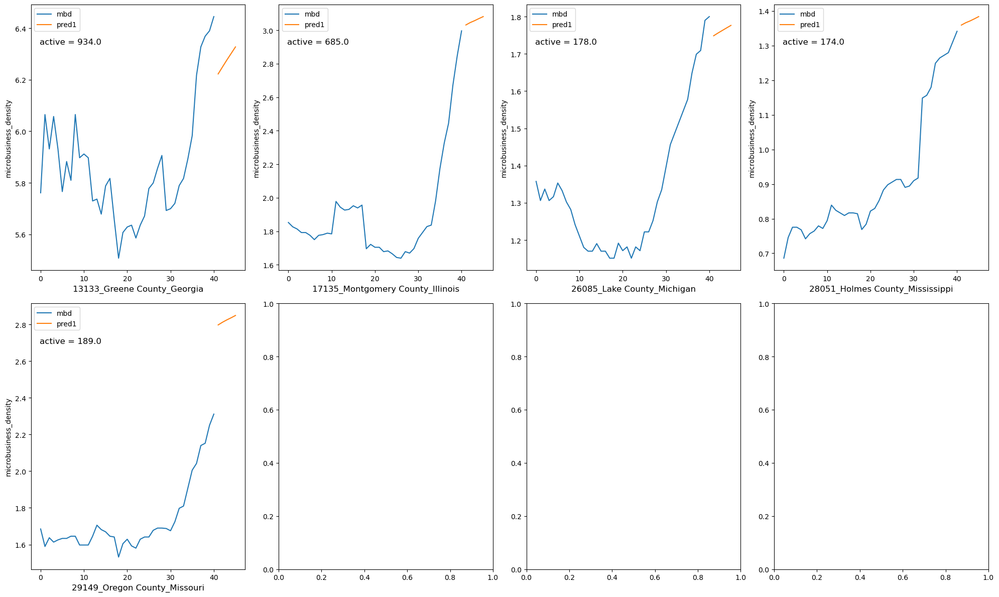

In [52]:
plot_mbd_with_active([13133, 17135, 26085, 28051, 29149])

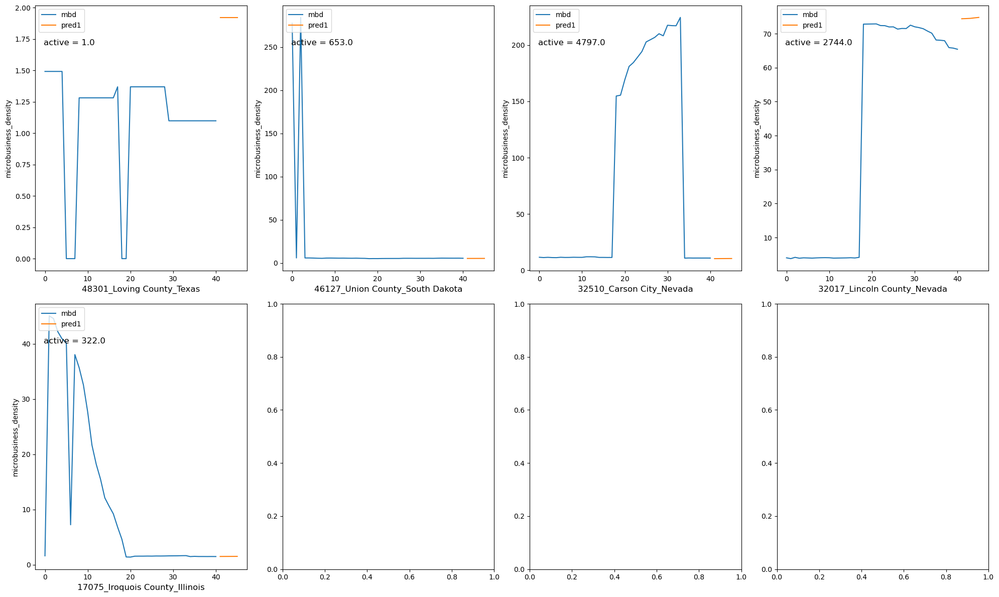

In [55]:
# 急激な上昇のある群
plot_mbd_with_active([48301, 46127, 32510, 32017, 17075])

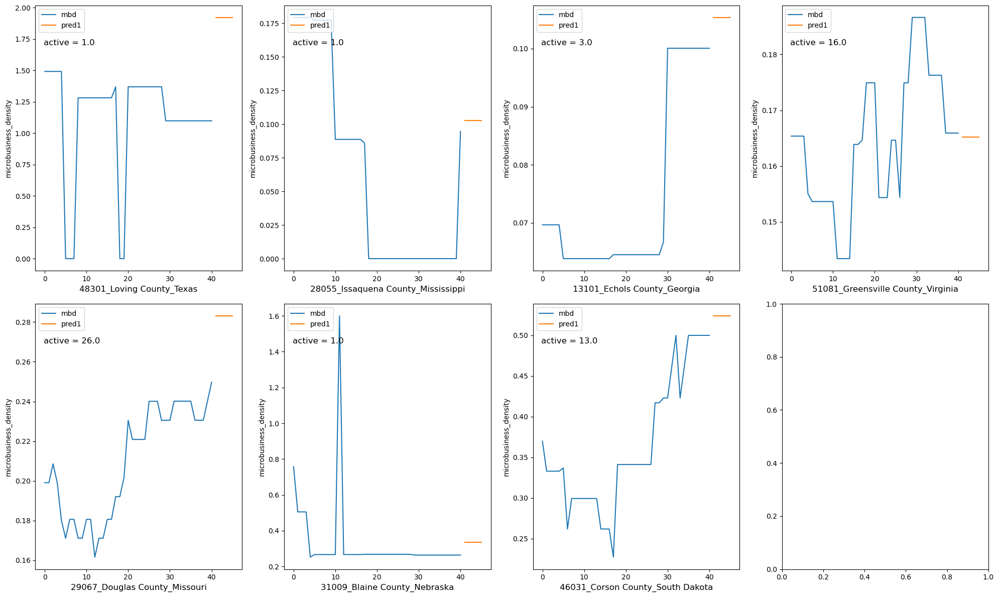

In [54]:
# mbdの値が非常に小さい群
plot_mbd_with_active([48301, 28055, 13101, 51081, 29067, 31009, 46031])

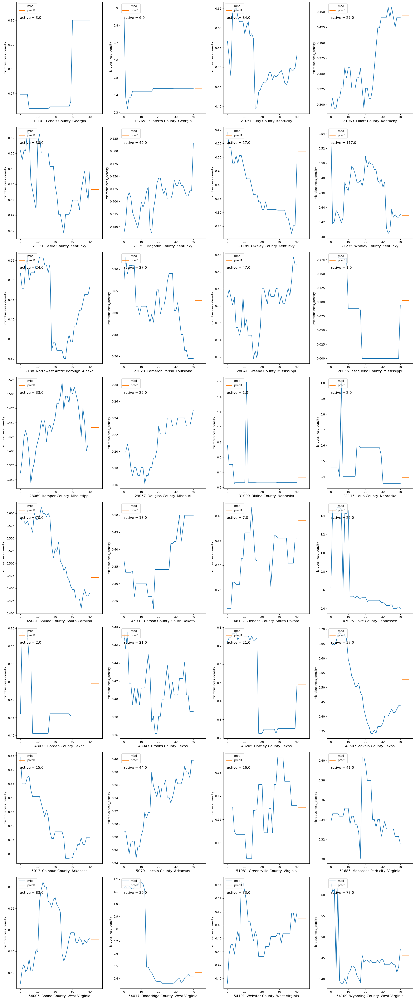

In [56]:
# 2022-10-01でmbdが0.5以下の群
low_mbd = utils.load_pickle('low_mbds_list')
plot_mbd_with_active(low_mbd)

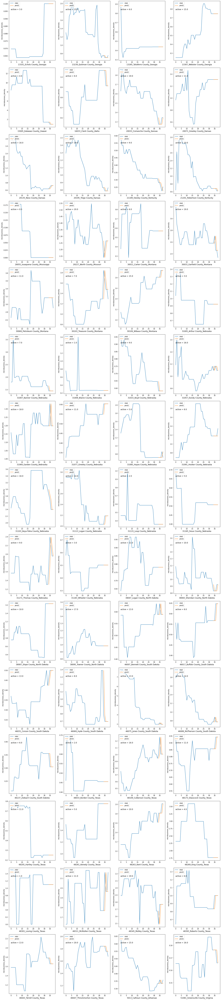

In [24]:
# 2022-10-01でactiveが20以下の群
low_active = utils.load_pickle('low_active_list')
plot_mbd_with_active(low_active)

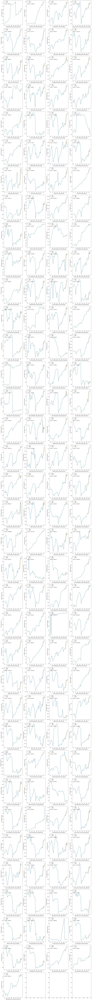

In [10]:
#トレンドの群
trend_active25000 = [10003, 10005,  1073, 11001, 12011, 12021, 12031, 12057, 12071,
       12081, 12086, 12095, 12099, 12101, 12103, 12105, 12109, 12115,
       12117, 12127, 13067, 13089, 13121, 15003, 16001, 17031, 17097,
       17197, 18057, 18097, 20091, 21111, 24003, 24013, 24031, 24510,
       25009, 25017, 25021, 25023, 26081, 26099, 26125, 27053, 29095,
       29183, 29189, 31055, 32003, 32031, 33011, 34003, 34005, 34007,
       34013, 34017, 34021, 34023, 34025, 34029, 34039, 35001, 36005,
       36029, 36047, 36061, 36081, 36085, 36103, 36119, 37081, 37119,
       37183, 39061, 39113, 40109,  4013, 40143,  4019, 41005, 41039,
       41051, 41067, 42003, 42017, 42029, 42091, 42101, 45019, 45045,
       46099, 47037, 47093, 47157, 47187, 48029, 48085, 48113, 48121,
       48157, 48201, 48339, 48453, 48491, 49035, 49049, 51013, 51059,
       51107, 51510, 51810, 53011, 53053, 53061, 55025, 55079, 55133,
       56033,  6001,  6013,  6019,  6059,  6065,  6067,  6071,  6073,
        6075,  6079,  6081,  6083,  6085,  6087,  6097,  8005,  8031,
        8035,  8041,  8059,  9001,  9003,  9009]

plot_mbd_with_active(trend_active25000)

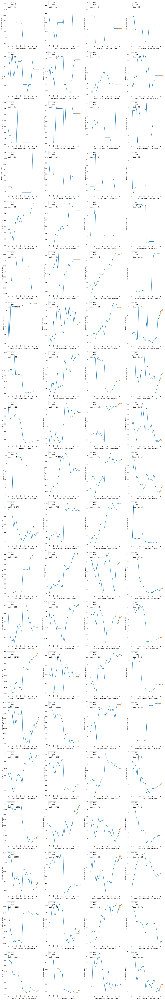

In [119]:
cfips_best = err_valid1.sort_values().index.to_list()
plot_mbd_with_active(cfips_best[:80])

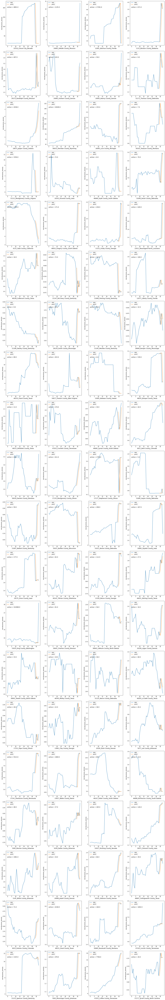

In [120]:
cfips_worst = err_valid1.sort_values(ascending=False).index.to_list()
plot_mbd_with_active(cfips_worst[:80])

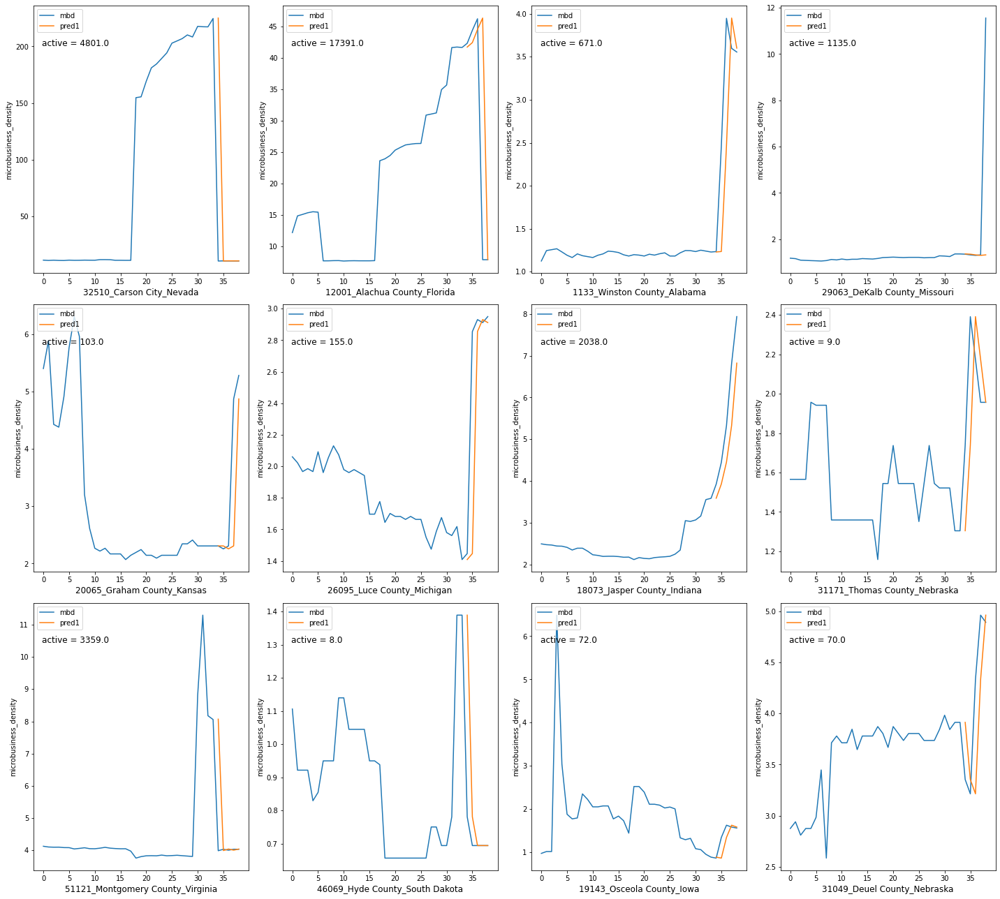

In [125]:
cfips_worst = err_valid2.sort_values(ascending=False).index.to_list()
plot_mbd_with_active(cfips_worst[:12])

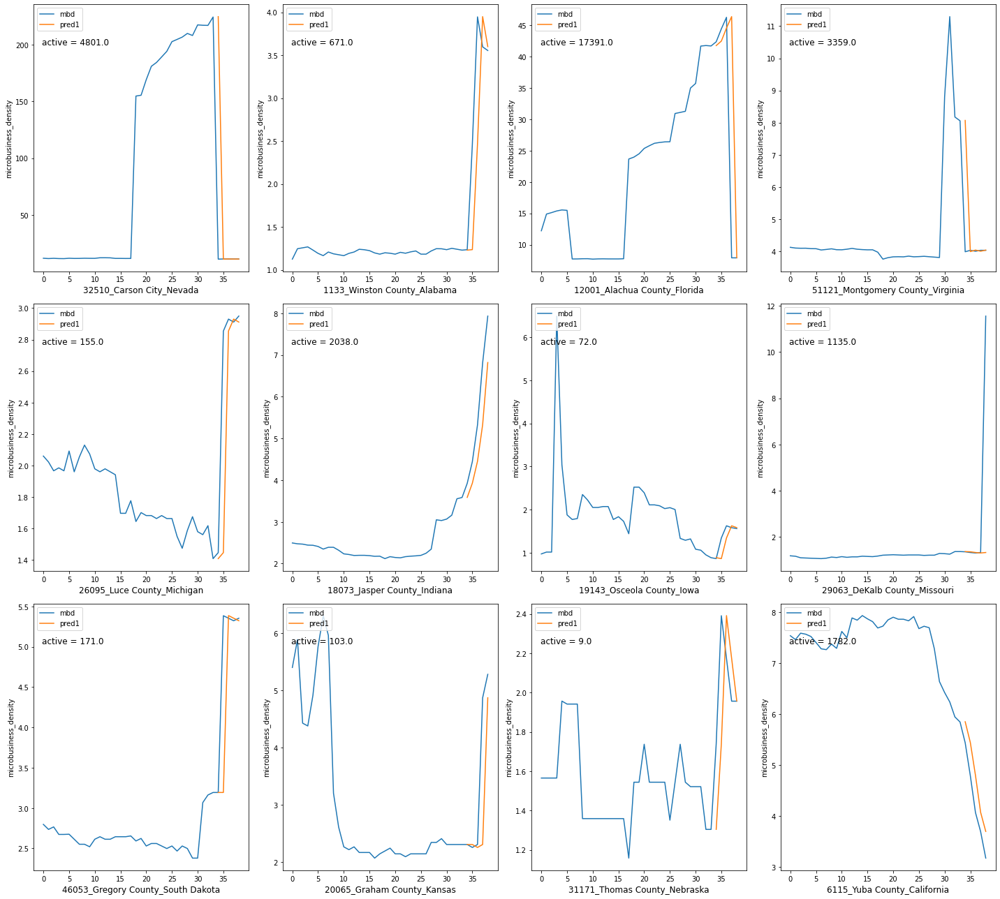

In [126]:
cfips_worst = err_valid3.sort_values(ascending=False).index.to_list()
plot_mbd_with_active(cfips_worst[:12])

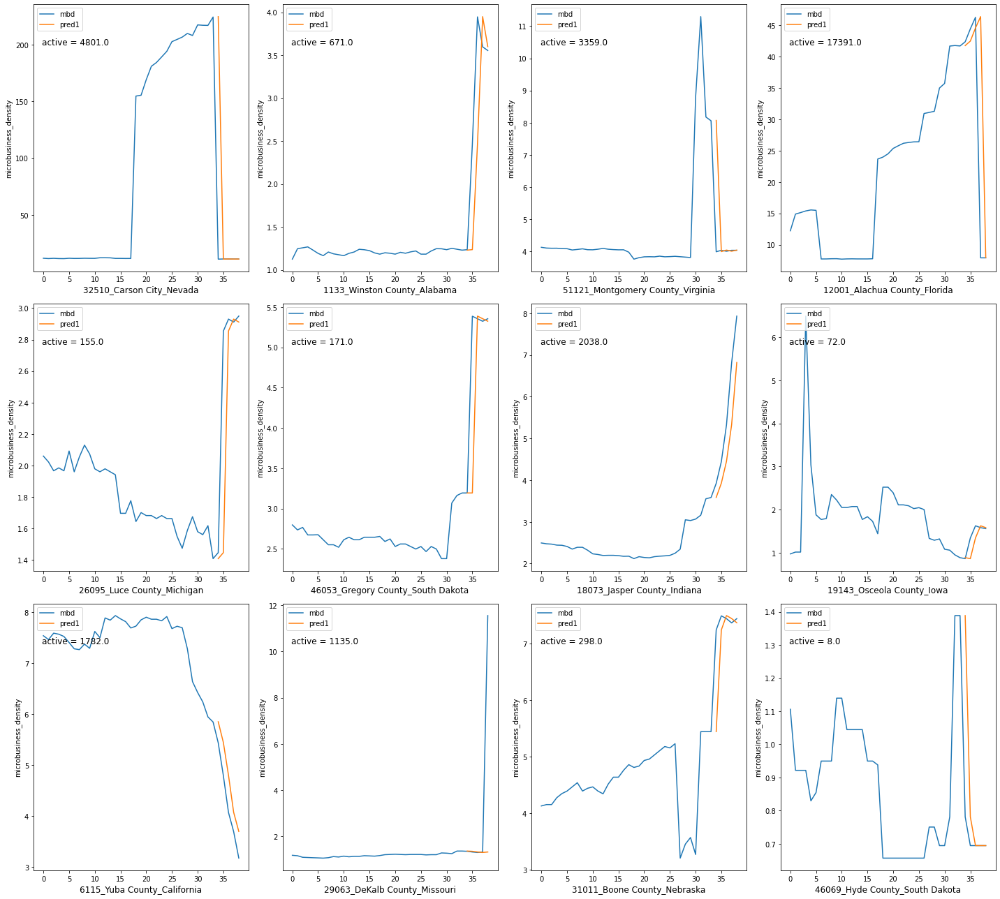

In [127]:
cfips_worst = err_valid4.sort_values(ascending=False).index.to_list()
plot_mbd_with_active(cfips_worst[:12])

In [134]:
df_all[df_all['cfips']==46099].iloc[:, :]

,row_id,cfips,county,state,microbusiness_density,active,year,month,scale,mbd_pred_1,mbd_pred_2,mbd_pred_3,mbd_pred_4
103494,46099_2019-08-01,46099,Minnehaha County,South Dakota,9.910047,13606.0,2019,8,0,NaN,NaN,NaN,NaN
103495,46099_2019-09-01,46099,Minnehaha County,South Dakota,32.596233,44753.0,2019,9,1,NaN,NaN,NaN,NaN
103496,46099_2019-10-01,46099,Minnehaha County,South Dakota,9.904221,13598.0,2019,10,2,NaN,NaN,NaN,NaN
103497,46099_2019-11-01,46099,Minnehaha County,South Dakota,32.935650,45219.0,2019,11,3,NaN,NaN,NaN,NaN
103498,46099_2019-12-01,46099,Minnehaha County,South Dakota,33.061657,45392.0,2019,12,4,NaN,NaN,NaN,NaN
103499,46099_2020-01-01,46099,Minnehaha County,South Dakota,32.451347,45256.0,2020,1,5,NaN,NaN,NaN,NaN
103500,46099_2020-02-01,46099,Minnehaha County,South Dakota,32.340202,45101.0,2020,2,6,NaN,NaN,NaN,NaN
103501,46099_2020-03-01,46099,Minnehaha County,South Dakota,32.416210,45207.0,2020,3,7,NaN,NaN,NaN,NaN
103502,46099_2020-04-01,46099,Minnehaha County,South Dakota,32.470707,45283.0,2020,4,8,NaN,NaN,NaN,NaN
103503,46099_2020-05-01,46099,Minnehaha County,South Dakota,32.506561,45333.0,2020,5,9,NaN,NaN,NaN,NaN
